#Indabax Workshop: Deep Reinforcement Learning with tensorfow 2.0

##Introduction:

In this colab, we introduce the idea of reinforcement learning, discuss the components of a value-based method such as Deep Q-Network, and build an agent that learns to solve  OpenAI Gym's LunarLander environment.

<img src="https://user-images.githubusercontent.com/10624937/42135612-cbff24aa-7d12-11e8-9b6c-2b41e64b3bb0.gif" alt="Trained Agent" title="Trained Agent" style="max-width:100%;">

##Learning objectives: 
* Understand the relationship between the environment and the agent
* Understand how a policy is used to select an action.
* Describe how to implement a run-loop that controls the interaction between environement and agent.
* Understand how the state, action and reward are communicated between the agent and the environment.
* Be able to implement the a simple value-based RL algorithm: DQN 

##Reinforcement learning:

## OpenAI Gym
Before we start coding the algorithm we introduce OpenAi Gym. It provides various kinds of benchmark reinforcement learning environments (including Atari games) and defines the common interface among them.

An environment object can be initialized by gym.make("environment_name")
The formats of action and observation of an environment are defined by env.action_space and env.observation_space, respectively.

We interact with the environment through three major api calls:
*   env.reset: resets the env to the original setting and returns the initial observation.
*   env.step: will execute a given action, move to the next state and return four values:
      - a next observation
      - a scalar reward
      - a boolean value indicating whether the current state is terminal or not
      - additional information
* env.render will render the current state




## Environment details: 

In the LunarLander environment the landing pad is always at coordinates (0,0). Coordinates are the first two numbers in state vector.
Reward for moving from the top of the screen to landing pad and zero speed is about 100..140 points. If lander moves away from landing pad it loses reward back. 

Episode finishes if the lander crashes or comes to rest, receiving additional -100 or +100 points. Each leg ground contact is +10. Firing main engine is -0.3 points each frame. 

Landing outside landing pad is possible. Fuel is infinite, so an agent can learn to fly and then land on its first attempt.
Four discrete actions available: 
- do nothing
- fire left orientation engine
- fire main engine
- fire right orientation engine.

The game is considered solved when the agent reaches 200 points!

## Getting started:


### Installation and imports
So first we install the following packages: 

In [0]:
#Download tf 2.0
!pip install -q tf-nightly-gpu-2.0-preview
!pip install -q box2d-py
!pip install -q gym[Box_2D]
!apt-get -qq -y install xvfb freeglut3-dev ffmpeg> /dev/null
!pip -q install pyglet
!pip -q install pyopengl
!pip -q install pyvirtualdisplay

    100% |████████████████████████████████| 345.3MB 58kB/s 
    100% |████████████████████████████████| 61kB 21.3MB/s 
    100% |████████████████████████████████| 3.0MB 8.0MB/s 
    100% |████████████████████████████████| 358kB 11.3MB/s 
thinc 6.12.1 has requirement wrapt<1.11.0,>=1.10.0, but you'll have wrapt 1.11.1 which is incompatible.
spacy 2.0.18 has requirement numpy>=1.15.0, but you'll have numpy 1.14.6 which is incompatible.
fastai 1.0.51 has requirement numpy>=1.15, but you'll have numpy 1.14.6 which is incompatible.
    100% |████████████████████████████████| 450kB 10.0MB/s 
  gym 0.10.11 does not provide the extra 'box_2d'


Then we import the necessary packages and set the environment

In [0]:
import gym
import random
import torch
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline

### Examine the State and Action Spaces
 The simulation contains a single agent that is moving from the top to the landing pad.  At each time step, it has four actions at its disposal

Run the code cell below to print some information about the environment.

In [0]:
#set the environmnet and visualize state and actions
env = gym.make('LunarLander-v2')
env.seed(0)
state_size =  env.observation_space.shape
print('State shape: ',state_size)
print('States look like:', env.reset(),'\n')
action_size =  env.action_space.n
print('Number of actions: ',action_size,'\n')

action = env.action_space.sample()
obs, r, done, info = env.step(action)
print('next observation:', obs,'\n')
print('reward:', r)
print('done:', done)
print('info:', info)


State shape:  (8,)
States look like: [-5.9156417e-04  1.4134574e+00 -5.9935719e-02  1.1277095e-01
  6.9228926e-04  1.3576316e-02  0.0000000e+00  0.0000000e+00] 

Number of actions:  4 

next observation: [-1.1833191e-03  1.4154168e+00 -5.9854437e-02  8.7087154e-02
  1.3631723e-03  1.3419589e-02  0.0000000e+00  0.0000000e+00] 

reward: 1.940546167119379
done: False
info: {}


##Components

In [0]:
import logging
import numpy as np
import tensorflow as tf


print(tf.__version__)
print(tf.executing_eagerly())

2.0.0-dev20190412
True


###Define the model architecture


We need to create a Model by subclassing thetf.keras.Model class: in that case,  define the model layers in __init__ and then implement the model's forward pass in call.

tf.keras is TensorFlow's implementation of the Keras API specification. This is a high-level API to build and train models that includes first-class support for TensorFlow-specific functionality, such as eager execution, tf.data pipelines, and Estimators. tf.keras makes TensorFlow easier to use without sacrificing flexibility and performance.

To build a simple, fully-connected network:

In [0]:
from tensorflow.keras import layers,optimizers, losses
import random
from collections import namedtuple, deque


class QNetwork(tf.keras.Model):
    def __init__(self,state_size, action_size, fc1_units=64, fc2_units=64):
        super(QNetwork, self).__init__()
        # no tf.get_variable(), just simple Keras API
        self.fc1 = layers.Dense(fc1_units, activation='relu')
        self.fc2 = layers.Dense(fc2_units, activation='relu')
        self.logits = layers.Dense(action_size, name='qvalues', activation='linear')

    def call(self, inputs):
        # inputs is a numpy array, convert to Tensor
        # separate hidden layers from the same input tensor
        x = self.fc1(inputs)
        x = self.fc2(x)
        return self.logits(x)

Let’s verify the model works as expected:

In [0]:
state= env.reset()  #reset the environment
agent = QNetwork(state_size=state_size, action_size=action_size)
q = agent(state[None,:]) 

print("Is there a GPU available: "),
print(tf.test.is_gpu_available())

print("Is the Tensor on GPU #0:  "),
print(q.device.endswith('GPU:0'))

Is there a GPU available: 
True
Is the Tensor on GPU #0:  
True


### Define the dqn agent:

The agent class acts like a container for the agent related properties and methods.
* We have **two networks ** of the same structure. Both have the same network architectures with the state observaion as the inputs and Q-values over all actions as the outputs.

* The act() method implements the** ε-greedy policy**. With probability epsilon, it chooses a random action, otherwise it selects the best action the current ANN returns. And of course we decrease  epsilon parameter with time. This way we start with a policy that explores greatly and behaves more and more greedily over time.

* As we are interacting with the environment, tuples of experience are gradually added to a replay buffer. Then if enough samples are available in memory,the agent can start sampling from it and learning from its past experience. This act of sampling a small batch of tuples from the replay buffer in order to learn is known as **experience replay**.

*  **Fixed Target network**: We use a separate target network for setting the targets. This network is a mere copy of the behaviour network (local network), but frozen in time. It provides stable Q~values and allows the algorithm to converge to the specified target. It takes the "next_states" tensor as input, because we use its prediction to select the optimal next state in the Bellman equation:

                                  Q(s,a)→r+γ max_{a'} Q(s',a')

  After several steps, the target network is updated, just by copying the weights from the current network.

* A drawback of using fixed Q-targets is that it substantially slows down the learning process. Any change in the Q function is propagated only after the target network update. The intervals between updates are usually in order of thousands of steps, so this can really slow things down.
So, Rather then periodically setting the target network equal to the local network, we can  instead update the target network with **“soft updates"**. Referring to the code snippet below in soft_update method , target parameters are updated by progressively replacing small amounts (tau) of the target network with the current main network   in turn making the target network update with more stability, and improving training effectiveness.

In [0]:
class DQNAgent():
    """Interacts with and learns from the environment."""

    def __init__(self, state_size, action_size, seed, filename=None):
        """Initialize an Agent object.
        
        Params
        ======
            state_size (int): dimension of each state
            action_size (int): dimension of each action
            seed (int): random seed
        """
        self.state_size = state_size
        self.action_size = action_size
        self.seed = seed
        
        random.seed(self.seed)
        np.random.seed(self.seed)
        #tf.random.set_random_seed(self.seed)

        # define the hyperparameters 
        self.params = {
            'gamma': 0.99,              # discount factor    
            'batch_size': 128,           # batch size
            'buffer_size': int(1e5),    # replay buffer size
            'tau': tf.constant(1e-3),   # interpolation parameter for uplying soft update of the
            'lr': 5e-4,                 # learning rate
            'update_every': 4,          # how often to update the network
            'update_target': 10000      # used when running with fixed q target (non soft update)
        }
        # Q-Network
        self.qnetwork_local = QNetwork(state_size, action_size)
        self.qnetwork_target = QNetwork(state_size, action_size) 
        # copy weights from local to target Q-network
        self.qnetwork_target.set_weights(self.qnetwork_local.get_weights()) 
        self.qnetwork_local.compile(optimizer=optimizers.Adam(self.params['lr']),loss=self._loss)
        
        #if filename:
         #   self.qnetwork_local.load_weights(filename)
          #  self.qnetwork_target.load_weights(filename)

        # Replay mitemory
        self.memory = ReplayBuffer(action_size, self.params['buffer_size'], self.params['batch_size'],seed)
        # Initialize time step (for updating every UPDATE_EVERY steps)
        self.training_step = 0
        self.update_step = 0
        
    def step(self, state, action, reward, next_state, done):
        # Save experience in replay memory
        self.memory.add(state, action, reward, next_state, done)
        
        # Learn every UPDATE_EVERY time steps.
        self.training_step = (self.training_step + 1) % self.params['update_every']
        if self.training_step == 0:
            # If enough samples are available in memory, get random subset and learn
            if len(self.memory) > self.params['batch_size']:
                experiences = self.memory.sample()
                self.learn(experiences, self.params['gamma'])
                
        #trying fixed qtargets
        #self.update_step =(self.update_step +1 ) % self.params['update_target']
        #if self.update_step == 0:
 
    def act(self, state, eps=0.):
        """Returns actions for given state as per current policy.
        
        Params
        ======
            state (array_like): current state
            eps (float): epsilon, for epsilon-greedy action selection
        """     
        action_values = self.qnetwork_local(state.reshape((1, -1)))
        
        # Epsilon-greedy action selection
        if random.random() > eps:
            return np.argmax(action_values)
        else:
            return random.choice(np.arange(self.action_size))

    def learn(self, experiences, gamma):
        """Update value parameters using given batch of experience tuples.
        Params
        ======
            experiences : tuple of (s, a, r, s', done) tuples 
            gamma (float): discount factor
        """
        states, actions, rewards, next_states, dones = experiences
        # Get predicted Q values (for next states) from target model
        Q_targets_next = self.qnetwork_target(next_states)
        # Compute Q targets for current states with max qtargets next
        Q_targets = rewards + (gamma * np.expand_dims(np.max(Q_targets_next, axis=1),1) * (1-dones))
        # a trick to input actions and qtargets through same API        
        actions_and_qtargets = np.concatenate((actions, Q_targets), axis=-1)
        losses = self.qnetwork_local.train_on_batch(states, actions_and_qtargets)
        logging.debug(" Losses: %s" , losses)

        # ------------------- update target network ------------------- #
        self.soft_update(self.qnetwork_local, self.qnetwork_target, self.params['tau']) 
        
    def _loss(self, actions_and_qtargets, logits):
        # a trick to input actions and qtargets through same API
        actions, Q_targets = actions_and_qtargets[:, 0], actions_and_qtargets[:, 1]
        actions = tf.cast(actions, tf.int32)
        
        # Get expected Q values from local model for the chosen actions only
        #gather_indices = tf.range(self.params['batch_size'] * 4) + tf.cast(actions, tf.int32)
        Q_expected = tf.reduce_sum(logits * tf.one_hot(actions, 4), axis=-1)
        mse = losses.MeanSquaredError()
        return mse(Q_expected,Q_targets)

    def soft_update(self, local_model, target_model, tau):
        """Soft update model parameters.
        θ_target = τ*θ_local + (1 - τ)*θ_target
        Params
        ======
            local_model : weights will be copied from
            target_model : weights will be copied to
            tau (float): interpolation parameter 
        """
        weights =[]
        for i in range(len(local_model.get_weights())):
            weights.append((local_model.get_weights()[i]*self.params['tau']) + (target_model.get_weights()[i]*(1-self.params['tau'])))
        target_model.set_weights(weights) 
        

### Define the replay buffer class

The purpose of the Replay Buffer class is to store experience. 
The add(sample) method stores the experience into the internal array, making sure that it does not exceed its capacity. The other method sample() returns "batch_size" random samples from the memory.

In [0]:
class ReplayBuffer:
    """Fixed-size buffer to store experience tuples."""

    def __init__(self, action_size, buffer_size, batch_size, seed):
        """Initialize a ReplayBuffer object.
        Params
        ======
            action_size (int): dimension of each action
            buffer_size (int): maximum size of buffer
            batch_size (int): size of each training batch
            seed (int): random seed
        """
        self.action_size = action_size
        self.memory = deque(maxlen=buffer_size)  
        self.batch_size = batch_size
        self.experience = namedtuple("Experience", field_names=["state", "action", "reward", "next_state", "done"])
        self.seed = random.seed(seed)
    
    def add(self, state, action, reward, next_state, done):
        """Add a new experience to memory."""
        e = self.experience(state, action, reward, next_state, done)
        self.memory.append(e)
    
    def sample(self):
        """Randomly sample a batch of experiences from memory."""
        experiences = random.sample(self.memory, k=self.batch_size)

        states = np.vstack([e.state for e in experiences if e is not None])
        actions = np.vstack([e.action for e in experiences if e is not None])
        rewards = np.vstack([e.reward for e in experiences if e is not None])
        next_states = np.vstack([e.next_state for e in experiences if e is not None])
        dones = np.vstack([e.done for e in experiences if e is not None]).astype(np.uint8)
  
        return (states, actions, rewards, next_states, dones)

    def __len__(self):
        """Return the current size of internal memory."""
    
        return len(self.memory)

## Training



### Define the agent training loop:

In [0]:
# set to logging.WARNING to disable logs or logging.DEBUG to see losses as well
logging.getLogger().setLevel(logging.INFO)

In [0]:
#instanciate the agent
agent = DQNAgent(state_size=state_size, action_size=action_size, seed=0)

In [0]:
n_episodes=2000
max_t=1000
eps_start=1.0
eps_end=0.01
eps_decay=0.995

In [0]:
scores = []                        # list containing scores from each episode
scores_window = deque(maxlen=100)  # last 100 scores
eps = eps_start                    # initialize epsilon
for i_episode in range(1, n_episodes+1):
    state = env.reset()
    score = 0
    for t in range(max_t):
        action = agent.act(state, eps)
        next_state, reward, done, _ = env.step(action)
        agent.step(state, action, reward, next_state, done)
        state = next_state
        score += reward
        if done:
            break 
    scores_window.append(score)       # save most recent score
    scores.append(score)              # save most recent score
    eps = max(eps_end, eps_decay*eps) # decrease epsilon
    
    print('\rEpisode {}\tAverage Score: {:.2f}'.format(i_episode, np.mean(scores_window)), end="")
    if i_episode % 100 == 0:
        print('\rEpisode {}\tAverage Score: {:.2f}'.format(i_episode, np.mean(scores_window)))
    if np.mean(scores_window)>=200.0:
        print('\nEnvironment solved in {:d} episodes!\tAverage Score: {:.2f}'.format(i_episode-100, np.mean(scores_window)))
        agent.qnetwork_local.save_weights('path_to_my_model.h5')
        break

Episode 100	Average Score: -167.94
Episode 200	Average Score: -89.13
Episode 300	Average Score: -21.37
Episode 400	Average Score: 73.52
Episode 500	Average Score: 163.12
Episode 600	Average Score: 184.85
Episode 661	Average Score: 200.41
Environment solved in 561 episodes!	Average Score: 200.41


##Visualization¶
###Plots

We can plot the average score over episodes to see the performance of our agent

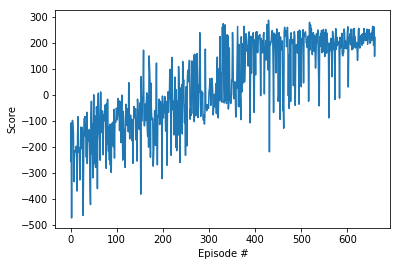

In [0]:
# plot the scores
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(np.arange(len(scores)), scores)
plt.ylabel('Score')
plt.xlabel('Episode #')
plt.show()

##Videos

Now as we finished training the agent, it is helpful to visualize its performance by rendering the environment at each step. 


The following code visualizes the agent's policy for a few episodes (no epsilon greedy)

In [0]:
# Start virtual display
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1024, 768))
display.start()
import os
os.environ["DISPLAY"] = ":" + str(display.display) + "." + str(display.screen)

Test episode: 0 Score: 192.08970298862394
Test episode: 1 Score: 200.5236529857612
Test episode: 2 Score: 100.31277611185993
Test episode: 3 Score: 119.30355657665956


I0412 17:59:26.082201 139755658766208 animation.py:1146] Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Test episode: 4 Score: 135.32352298570865


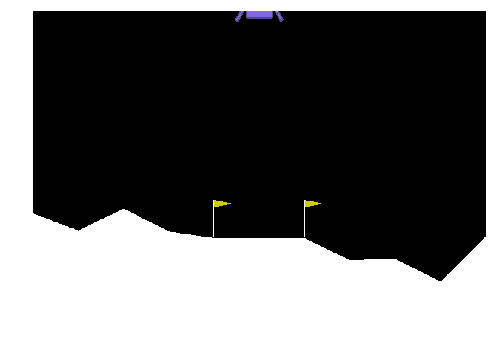

In [0]:
import gym

#set the environmnet and visualize state and actions
env = gym.make('LunarLander-v2')

env.seed(0)
frames = []
for i in range(5):
    state = env.reset()
    score = 0
    while True:
        frames.append(env.render(mode = 'rgb_array'))
        #action = env.action_space.sample()
        action = agent.act(state)
        state, reward, done, _ = env.step(action)
        score += reward
        if done: 
            break
    print('Test episode:', i, 'Score:', score)
env.render()

import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np
from IPython.display import HTML

plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

## Improvements:
 
* Huber loss instead of MSE because MSE  makes the network “care” a lot more about large errors than about small ones due to the squaring operation. An alternative to the MSE is the MAE (Mean Absolute Error), which takes the absolute value of the residual. MAE cares about reducing large errors just as much as small errors,  however, it ignores our intuition that large errors should somehow “matter more”. This is where the Huber loss comes in: it uses MSE for low values and MAE for large values. 
* Prioritized experience replay
* ....